In [1]:
from IPython.display import HTML
from matplotlib.animation import FuncAnimation
from scikits.odes import dae
from scipy.optimize import fsolve
import matplotlib.pyplot as plt
import numpy as np
import sympy as sm
import sympy.physics.mechanics as me
me.init_vprinting(use_latex='mathjax')

In [2]:
class ReferenceFrame(me.ReferenceFrame):

    def __init__(self, *args, **kwargs):

        kwargs.pop('latexs', None)

        lab = args[0].lower()
        tex = r'\hat{{{}}}_{}'

        super(ReferenceFrame, self).__init__(*args,
                                             latexs=(tex.format(lab, 'x'),
                                                     tex.format(lab, 'y'),
                                                     tex.format(lab, 'z')),
                                             **kwargs)
me.ReferenceFrame = ReferenceFrame

In [3]:
g = sm.symbols('g')
mu, ma, mb, mf = sm.symbols('m_u, m_a, m_b, m_f')
Ia, Ib = sm.symbols('I_a, I_b')
kf, cf, kk, ck = sm.symbols('k_f, c_f, k_k, c_k')
la, lb, da, db = sm.symbols('l_a, l_b, d_a, d_b')

q1, q2, q3 = me.dynamicsymbols('q1, q2, q3', real=True)
u1, u2, u3 = me.dynamicsymbols('u1, u2, u3', real=True)
Tk = me.dynamicsymbols('T_k')

t = me.dynamicsymbols._t

q = sm.Matrix([q1, q2, q3])
u = sm.Matrix([u1, u2, u3])
ud = u.diff(t)
us = sm.Matrix([u1, u3])
usd = us.diff(t)
p = sm.Matrix([
    Ia,
    Ib,
    cf,
    ck,
    da,
    db,
    g,
    kf,
    kk,
    la,
    lb,
    ma,
    mb,
    mf,
    mu,
])
r = sm.Matrix([Tk])

In [4]:
N = me.ReferenceFrame('N')
A = me.ReferenceFrame('A')
B = me.ReferenceFrame('B')

A.orient_axis(N, q2, N.z)
B.orient_axis(A, q3, N.z)

A.set_ang_vel(N, u2*N.z)
B.set_ang_vel(A, u3*N.z)

O = me.Point('O')
Ao, Bo = me.Point('A_o'), me.Point('B_o')
Pu, Pk, Pf = me.Point('P_u'), me.Point('P_k'), me.Point('P_f')

Pf.set_pos(O, q1*N.y)
Ao.set_pos(Pf, da*A.x)
Pk.set_pos(Pf, la*A.x)
Bo.set_pos(Pk, db*B.x)
Pu.set_pos(Pk, lb*B.x)

O.set_vel(N, 0)
Pf.set_vel(N, u1*N.y)
Pk.v2pt_theory(Pf, N, A)
Pu.v2pt_theory(Pk, N, B)

qd_repl = {q1.diff(t): u1, q2.diff(t): u2, q3.diff(t): u3}
qdd_repl = {q1.diff(t, 2): u1.diff(t), q2.diff(t, 2): u2.diff(t), q3.diff(t, 2): u3.diff(t)}

holonomic = Pu.pos_from(O).dot(N.x)
vel_con = holonomic.diff(t).xreplace(qd_repl)
acc_con = vel_con.diff(t).xreplace(qdd_repl).xreplace(qd_repl)

# q2 is dependent

u2_repl = {u2: sm.solve(vel_con, u2)[0]}
u2d_repl = {u2.diff(t): sm.solve(acc_con, u2.diff(t))[0].xreplace(u2_repl)}

In [5]:
R_Pu = -mu*g*N.y
R_Ao = -ma*g*N.y
R_Bo = -mb*g*N.y

zp = (sm.Abs(q1) - q1)/2
damping = sm.Piecewise((-cf*u1, q1<0), (0.0, True))
Ff = (kf*zp**(sm.S(3)/2) + damping)*N.y

R_Pf = -mf*g*N.y + Ff
R_Pf

⎛                          3/2                         ⎞    
⎜             ⎛  q₁   │q₁│⎞      ⎛⎧-c_f⋅u₁  for q₁ < 0⎞⎟    
⎜-g⋅m_f + k_f⋅⎜- ── + ────⎟    + ⎜⎨                   ⎟⎟ n_y
⎝             ⎝  2     2  ⎠      ⎝⎩  0.0    otherwise ⎠⎠    

In [6]:
T_A = (kk*(q3 - sm.pi/2) + ck*u3 + Tk)*N.z
T_B = -T_A
T_A

⎛           ⎛     π⎞     ⎞    
⎜cₖ⋅u₃ + kₖ⋅⎜q₃ - ─⎟ + Tₖ⎟ n_z
⎝           ⎝     2⎠     ⎠    

In [7]:
I_A_Ao = Ia*me.outer(N.z, N.z)
I_B_Bo = Ib*me.outer(N.z, N.z)

In [8]:
points = [Pu, Ao, Bo, Pf]
forces = [R_Pu, R_Ao, R_Bo, R_Pf]
masses = [mu, ma, mb, mf]

frames = [A, B]
torques = [T_A, T_B]
inertias = [I_A_Ao, I_B_Bo]

Fr_bar = []
Frs_bar = []

for ur in [u1, u3]:

   Fr = 0
   Frs = 0

   for Pi, Ri, mi in zip(points, forces, masses):
      N_v_Pi = Pi.vel(N).xreplace(u2_repl)
      vr = N_v_Pi.diff(ur, N)
      Fr += vr.dot(Ri)
      N_a_Pi = Pi.acc(N).xreplace(u2d_repl).xreplace(u2_repl)
      Rs = -mi*N_a_Pi
      Frs += vr.dot(Rs)

   for Bi, Ti, Ii in zip(frames, torques, inertias):
      N_w_Bi = Bi.ang_vel_in(N).xreplace(u2_repl)
      N_alp_Bi = Bi.ang_acc_in(N).xreplace(u2d_repl).xreplace(u2_repl)
      wr = N_w_Bi.diff(ur, N)
      Fr += wr.dot(Ti)
      Ts = -(N_alp_Bi.dot(Ii) + me.cross(N_w_Bi, Ii).dot(N_w_Bi))
      Frs += wr.dot(Ts)

   Fr_bar.append(Fr)
   Frs_bar.append(Frs)

Fr = sm.Matrix(Fr_bar)
Frs = sm.Matrix(Frs_bar)
kane_eq = Fr + Frs

In [9]:
Vf = -sm.integrate(kf*zp**(sm.S(3)/2), q1)
Vf

 ⎛⎧       0          for q₁ ≥ 0⎞
 ⎜⎪                            ⎟
 ⎜⎪            5/2             ⎟
-⎜⎨-2⋅k_f⋅(-q₁)                ⎟
 ⎜⎪────────────────  otherwise ⎟
 ⎜⎪       5                    ⎟
 ⎝⎩                            ⎠

In [10]:
Vk = sm.integrate(kk*(q3 - sm.pi/2), q3)
Vk

     2          
kₖ⋅q₃    π⋅kₖ⋅q₃
────── - ───────
  2         2   

In [11]:
V = (
    (mf*g*Pf.pos_from(O) +
     ma*g*Ao.pos_from(O) +
     mb*g*Bo.pos_from(O) +
     mu*g*Pu.pos_from(O)).dot(N.y) +
    Vf + Vk
)
V

                                                                               ↪
                                               2                               ↪
                                          kₖ⋅q₃    π⋅kₖ⋅q₃                     ↪
g⋅mₐ⋅q₁ + g⋅m_b⋅q₁ + g⋅m_f⋅q₁ + g⋅mᵤ⋅q₁ + ────── - ─────── + (sin(q₂)⋅cos(q₃)  ↪
                                            2         2                        ↪
                                                                               ↪
                                                                               ↪

↪                                                                              ↪
↪                                                                              ↪
↪                                                                              ↪
↪ + sin(q₃)⋅cos(q₂))⋅(d_b⋅g⋅m_b + g⋅l_b⋅mᵤ) + (dₐ⋅g⋅mₐ + g⋅lₐ⋅m_b + g⋅lₐ⋅mᵤ)⋅s ↪
↪                                                                              ↪
↪                          

In [12]:
Kf = mf*me.dot(Pf.vel(N), Pf.vel(N))/2
Ku = mu*me.dot(Pu.vel(N), Pu.vel(N))/2
Kf, sm.simplify(Ku)

⎛      2     ⎛  2   2                                                          ↪
⎜m_f⋅u₁   mᵤ⋅⎝lₐ ⋅u₂  + 2⋅lₐ⋅l_b⋅(u₂ + u₃)⋅u₂⋅cos(q₃) + 2⋅lₐ⋅u₁⋅u₂⋅cos(q₂) + l ↪
⎜───────, ──────────────────────────────────────────────────────────────────── ↪
⎝   2                                                                  2       ↪

↪   2          2                                       2⎞⎞
↪ _b ⋅(u₂ + u₃)  + 2⋅l_b⋅(u₂ + u₃)⋅u₁⋅cos(q₂ + q₃) + u₁ ⎠⎟
↪ ───────────────────────────────────────────────────────⎟
↪                                                        ⎠

In [13]:
KA = ma*me.dot(Ao.vel(N), Ao.vel(N))/2 + me.dot(me.dot(A.ang_vel_in(N), I_A_Ao), A.ang_vel_in(N))/2
KA

     2      ⎛  2   2                          2⎞
Iₐ⋅u₂    mₐ⋅⎝dₐ ⋅u₂  + 2⋅dₐ⋅u₁⋅u₂⋅cos(q₂) + u₁ ⎠
────── + ───────────────────────────────────────
  2                         2                   

In [14]:
KB = mb*me.dot(Bo.vel(N), Bo.vel(N))/2 + me.dot(me.dot(B.ang_vel_in(N), I_B_Bo), B.ang_vel_in(N))/2
sm.simplify(KB)

             2       ⎛   2          2                                          ↪
I_b⋅(u₂ + u₃)    m_b⋅⎝d_b ⋅(u₂ + u₃)  + 2⋅d_b⋅lₐ⋅(u₂ + u₃)⋅u₂⋅cos(q₃) + 2⋅d_b⋅ ↪
────────────── + ───────────────────────────────────────────────────────────── ↪
      2                                                                        ↪

↪                               2   2                          2⎞
↪ (u₂ + u₃)⋅u₁⋅cos(q₂ + q₃) + lₐ ⋅u₂  + 2⋅lₐ⋅u₁⋅u₂⋅cos(q₂) + u₁ ⎠
↪ ───────────────────────────────────────────────────────────────
↪ 2                                                              

In [15]:
K = Kf + Ku + KA + KB

In [16]:
eval_kane = sm.lambdify((q, usd, us, r, p), kane_eq)
eval_holo = sm.lambdify((q, p), holonomic)
eval_vel_con = sm.lambdify((q, u, p), vel_con)
eval_acc_con = sm.lambdify((q, ud, u, p), acc_con)
eval_energy = sm.lambdify((q, us, p), (K.xreplace(u2_repl), V.xreplace(u2_repl)))

coordinates = Pf.pos_from(O).to_matrix(N)
for point in [Ao, Pk, Bo, Pu]:
   coordinates = coordinates.row_join(point.pos_from(O).to_matrix(N))
eval_point_coords = sm.lambdify((q, p), coordinates)

In [17]:
def eval_eom(t, x, xd, residual, p_r):
    """Returns the residual vector of the equations of motion.

    Parameters
    ==========
    t : float
       Time at evaluation.
    x : ndarray, shape(5,)
       State vector at time t: x = [q1, q2, q3, u1, u3].
    xd : ndarray, shape(5,)
       Time derivative of the state vector at time t: xd = [q1d, q2d, q3d, u1d, u3d].
    residual : ndarray, shape(5,)
       Vector to store the residuals in: residuals = [fk, fd, fh].
    r : function
      Function of [Tk] = r(t, x) that evaluates the input Tk.
    p : ndarray, shape(15,)
       Constant parameters: p = [Ia, Ib, cf, ck, da, db, g, kf, kk, la, lb,
       ma, mb, mf, mu]

    """

    p, r = p_r

    q1, q2, q3, u1, u3 = x
    q1d, _, q3d, u1d, u3d = xd  # ignore the q2d value

    residual[0] = -q1d + u1
    residual[1] = -q3d + u3
    residual[2:4] = eval_kane([q1, q2, q3], [u1d, u3d], [u1, u3], r(t, x, p), p).squeeze()
    residual[4] = eval_holo([q1, q2, q3], p)

In [18]:
def setup_initial_conditions(q1, q3, u1, u3):

   q0 = np.array([q1, np.nan, q3])

   q0[1] = fsolve(lambda q2: eval_holo([q0[0], q2, q0[2]], p_vals),
                  np.deg2rad(45.0))[0]

   u0 = np.array([u1, u3])

   u20 = fsolve(lambda u2: eval_vel_con(q0, [u0[0], u2, u0[1]], p_vals),
                np.deg2rad(0.0))[0]

   x0 = np.hstack((q0, u0))

   # TODO : use equations to set these
   ud0 = np.array([0.0, 0.0])

   xd0 = np.hstack(([u0[0], u20, u0[1]], ud0))

   return x0, xd0

In [19]:
def simulate(t0, tf, fps, x0, xd0, p_vals, eval_r):

   ts = np.linspace(t0, tf, num=int(fps*(tf - t0)))

   solver = dae('ida',
                eval_eom,
                rtol=1e-8,
                atol=1e-8,
                algebraic_vars_idx=[4],
                user_data=(p_vals, eval_r),
                old_api=False)

   solution = solver.solve(ts, x0, xd0)

   ts = solution.values.t
   xs = solution.values.y

   Ks, Vs = eval_energy(xs[:, :3].T, xs[:, 3:].T, p_vals)
   Es = Ks + Vs

   Tks = np.empty_like(ts)
   for i, ti in enumerate(ts):
       Tks[i] = eval_r(ti, None, None)[0]

   return ts, xs, Ks, Vs, Es, Tks

In [20]:
def plot_results(ts, xs, Ks, Vs, Es, Tks):
    """Returns the array of axes of a 4 panel plot of the state trajectory
    versus time.

    Parameters
    ==========
    ts : array_like, shape(n,)
       Values of time.
    xs : array_like, shape(n, 4)
       Values of the state trajectories corresponding to ``ts`` in order
       [q1, q2, q3, u1, u3].

    Returns
    =======
    axes : ndarray, shape(3,)
       Matplotlib axes for each panel.

    """
    fig, axes = plt.subplots(6, 1, sharex=True, layout='constrained')

    fig.set_size_inches((10.0, 6.0))

    axes[0].plot(ts, xs[:, 0])  # q1(t)
    axes[1].plot(ts, np.rad2deg(xs[:, 1:3]))  # q2(t), q3(t)
    axes[2].plot(ts, xs[:, 3])  # u1(t)
    axes[3].plot(ts, np.rad2deg(xs[:, 4]))  # u3(t)
    axes[4].plot(ts, Ks)
    axes[4].plot(ts, Vs)
    axes[4].plot(ts, Es)
    axes[5].plot(ts, Tks)

    axes[0].legend(['$q_1$'])
    axes[1].legend(['$q_2$', '$q_3$'])
    axes[2].legend(['$u_1$'])
    axes[3].legend(['$u_3$'])
    axes[4].legend(['$K$', '$V$', '$E$'])
    axes[5].legend(['$T_k$'])

    axes[0].set_ylabel('Distance\n[m]')
    axes[1].set_ylabel('Angle\n[deg]')
    axes[2].set_ylabel('Speed\n[m/s]')
    axes[3].set_ylabel('Angular Rate\n[deg/s]')
    axes[4].set_ylabel('Energy\n[J]')
    axes[5].set_ylabel('Torque\n[N-m]')
    axes[5].set_xlabel('Time\n[s]')

    return axes

In [21]:
def setup_animation_plot(ts, xs, p):
    """Returns objects needed for the animation.

    Parameters
    ==========
    ts : array_like, shape(n,)
       Values of time.
    xs : array_like, shape(n, 4)
       Values of the state trajectories corresponding to ``ts`` in order
       [q1, q2, q3, u1].
    p : array_like, shape(?,)

    """

    x, y, _ = eval_point_coords(xs[0, :3], p)

    fig, ax = plt.subplots()
    fig.set_size_inches((10.0, 10.0))
    ax.set_aspect('equal')
    ax.grid()

    lines, = ax.plot(x, y, color='black',
                     marker='o', markerfacecolor='blue', markersize=10)

    title_text = ax.set_title('Time = {:1.1f} s'.format(ts[0]))
    ax.set_xlim((-0.5, 0.5))
    ax.set_ylim((0.0, 1.5))
    ax.set_xlabel('$x$ [m]')
    ax.set_ylabel('$y$ [m]')
    ax.set_aspect('equal')

    return fig, ax, title_text, lines

In [22]:
def animate_linkage(ts, xs, p):
    """Returns an animation object.

    Parameters
    ==========
    ts : array_like, shape(n,)
    xs : array_like, shape(n, 4)
       x = [q1, q2, q3, u1]
    p : array_like, shape(6,)
       p = [la, lb, lc, ln, m, g]

    """
    # setup the initial figure and axes
    fig, ax, title_text, lines = setup_animation_plot(ts, xs, p)

    # precalculate all of the point coordinates
    coords = []
    for xi in xs:
        coords.append(eval_point_coords(xi[:3], p))
    coords = np.array(coords)

    # define the animation update function
    def update(i):
        title_text.set_text('Time = {:1.1f} s'.format(ts[i]))
        lines.set_data(coords[i, 0, :], coords[i, 1, :])

    # close figure to prevent premature display
    plt.close()

    # create and return the animation
    return FuncAnimation(fig, update, len(ts))

In [23]:
p_vals = np.array([
  0.101,  # Ia,
  0.282,  # Ib,
  0.0,    # cf,
  0.0,    # ck,
  0.387,  # da,
  0.193,  # db,
  9.81,   # g,
  0.0,    # kf,
  0.0,    # kk,
  0.611,  # la,
  0.424,  # lb,
  6.769,  # ma,
  17.01,  # mb,
  3.0,    # mf,
  32.44,  # mu
])

x0, xd0 = setup_initial_conditions(0.2, np.deg2rad(20.0), 0.0, 0.0)

def eval_r(t, x, p):
   return [0.0]  # [Tk]

In [24]:
t0, tf, fps = 0.0, 0.5, 30
ts_dae, xs_dae, Ks, Vs, Es, Tks = simulate(t0, tf, fps, x0, xd0, p_vals, eval_r)

<lambdifygenerated-5>:5: RuntimeWarning: invalid value encountered in power
  return ((1/2)*_Dummy_143**2*I_a*l_b**2*sin(_Dummy_140 + _Dummy_141)**2/(l_a*sin(_Dummy_141) + l_b*sin(_Dummy_140 + _Dummy_141))**2 + (1/2)*_Dummy_144**2*m_f + (1/2)*I_b*(-_Dummy_143*l_b*sin(_Dummy_140 + _Dummy_141)/(l_a*sin(_Dummy_141) + l_b*sin(_Dummy_140 + _Dummy_141)) + _Dummy_143)**2 + (1/2)*m_a*(_Dummy_143**2*d_a**2*l_b**2*sin(_Dummy_140 + _Dummy_141)**2/(l_a*sin(_Dummy_141) + l_b*sin(_Dummy_140 + _Dummy_141))**2 - 2*_Dummy_143*_Dummy_144*d_a*l_b*sin(_Dummy_140 + _Dummy_141)*cos(_Dummy_141)/(l_a*sin(_Dummy_141) + l_b*sin(_Dummy_140 + _Dummy_141)) + _Dummy_144**2) + (1/2)*m_b*(_Dummy_143**2*l_a**2*l_b**2*sin(_Dummy_140 + _Dummy_141)**2/(l_a*sin(_Dummy_141) + l_b*sin(_Dummy_140 + _Dummy_141))**2 - 2*_Dummy_143*_Dummy_144*l_a*l_b*sin(_Dummy_140 + _Dummy_141)*cos(_Dummy_141)/(l_a*sin(_Dummy_141) + l_b*sin(_Dummy_140 + _Dummy_141)) - 2*_Dummy_143*d_b*l_a*l_b*(-_Dummy_143*l_b*sin(_Dummy_140 + _Dummy_141)/(l_a*

In [25]:
HTML(animate_linkage(ts_dae, xs_dae, p_vals).to_jshtml(fps=fps))

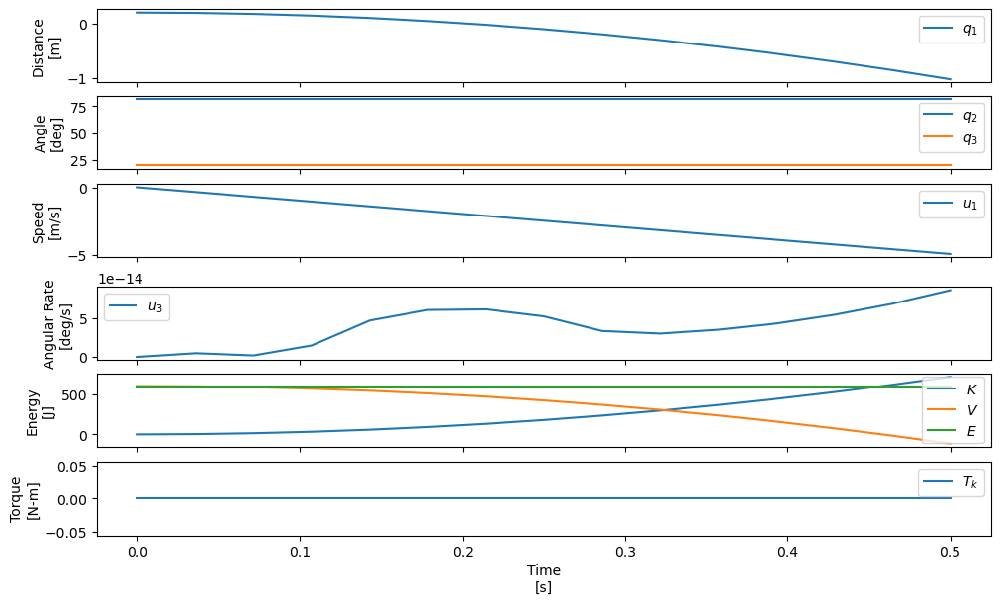

In [26]:
plot_results(ts_dae, xs_dae, Ks, Vs, Es, Tks);

In [27]:
p_vals = np.array([
  0.101,  # Ia,
  0.282,  # Ib,
  0.0,    # cf,
  0.0,    # ck,
  0.387,  # da,
  0.193,  # db,
  9.81,   # g,
  5e7,    # kf,
  0.0,    # kk,
  0.611,  # la,
  0.424,  # lb,
  6.769,  # ma,
  17.01,  # mb,
  3.0,    # mf,
  32.44,  # mu
])

In [28]:
t0, tf, fps = 0.0, 0.3, 100
ts_dae, xs_dae, Ks, Vs, Es, Tks = simulate(t0, tf, fps, x0, xd0, p_vals, eval_r)

<lambdifygenerated-5>:5: RuntimeWarning: invalid value encountered in power
  return ((1/2)*_Dummy_143**2*I_a*l_b**2*sin(_Dummy_140 + _Dummy_141)**2/(l_a*sin(_Dummy_141) + l_b*sin(_Dummy_140 + _Dummy_141))**2 + (1/2)*_Dummy_144**2*m_f + (1/2)*I_b*(-_Dummy_143*l_b*sin(_Dummy_140 + _Dummy_141)/(l_a*sin(_Dummy_141) + l_b*sin(_Dummy_140 + _Dummy_141)) + _Dummy_143)**2 + (1/2)*m_a*(_Dummy_143**2*d_a**2*l_b**2*sin(_Dummy_140 + _Dummy_141)**2/(l_a*sin(_Dummy_141) + l_b*sin(_Dummy_140 + _Dummy_141))**2 - 2*_Dummy_143*_Dummy_144*d_a*l_b*sin(_Dummy_140 + _Dummy_141)*cos(_Dummy_141)/(l_a*sin(_Dummy_141) + l_b*sin(_Dummy_140 + _Dummy_141)) + _Dummy_144**2) + (1/2)*m_b*(_Dummy_143**2*l_a**2*l_b**2*sin(_Dummy_140 + _Dummy_141)**2/(l_a*sin(_Dummy_141) + l_b*sin(_Dummy_140 + _Dummy_141))**2 - 2*_Dummy_143*_Dummy_144*l_a*l_b*sin(_Dummy_140 + _Dummy_141)*cos(_Dummy_141)/(l_a*sin(_Dummy_141) + l_b*sin(_Dummy_140 + _Dummy_141)) - 2*_Dummy_143*d_b*l_a*l_b*(-_Dummy_143*l_b*sin(_Dummy_140 + _Dummy_141)/(l_a*

In [29]:
HTML(animate_linkage(ts_dae, xs_dae, p_vals).to_jshtml(fps=fps))

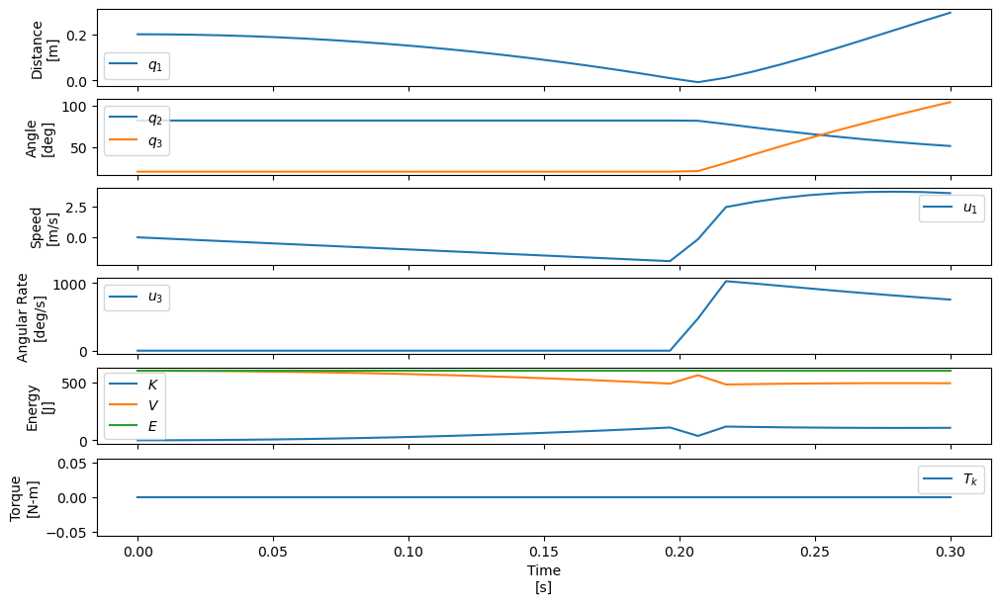

In [30]:
plot_results(ts_dae, xs_dae, Ks, Vs, Es, Tks);

In [31]:
p_vals = np.array([
  0.101,  # Ia,
  0.282,  # Ib,
  1e5,    # cf,
  0.0,    # ck,
  0.387,  # da,
  0.193,  # db,
  9.81,   # g,
  5e7,    # kf,
  0.0,    # kk,
  0.611,  # la,
  0.424,  # lb,
  6.769,  # ma,
  17.01,  # mb,
  3.0,    # mf,
  32.44,  # mu
])

t0, tf, fps = 0.0, 0.3, 100
ts_dae, xs_dae, Ks, Vs, Es, Tks = simulate(t0, tf, fps, x0, xd0, p_vals, eval_r)

<lambdifygenerated-5>:5: RuntimeWarning: invalid value encountered in power
  return ((1/2)*_Dummy_143**2*I_a*l_b**2*sin(_Dummy_140 + _Dummy_141)**2/(l_a*sin(_Dummy_141) + l_b*sin(_Dummy_140 + _Dummy_141))**2 + (1/2)*_Dummy_144**2*m_f + (1/2)*I_b*(-_Dummy_143*l_b*sin(_Dummy_140 + _Dummy_141)/(l_a*sin(_Dummy_141) + l_b*sin(_Dummy_140 + _Dummy_141)) + _Dummy_143)**2 + (1/2)*m_a*(_Dummy_143**2*d_a**2*l_b**2*sin(_Dummy_140 + _Dummy_141)**2/(l_a*sin(_Dummy_141) + l_b*sin(_Dummy_140 + _Dummy_141))**2 - 2*_Dummy_143*_Dummy_144*d_a*l_b*sin(_Dummy_140 + _Dummy_141)*cos(_Dummy_141)/(l_a*sin(_Dummy_141) + l_b*sin(_Dummy_140 + _Dummy_141)) + _Dummy_144**2) + (1/2)*m_b*(_Dummy_143**2*l_a**2*l_b**2*sin(_Dummy_140 + _Dummy_141)**2/(l_a*sin(_Dummy_141) + l_b*sin(_Dummy_140 + _Dummy_141))**2 - 2*_Dummy_143*_Dummy_144*l_a*l_b*sin(_Dummy_140 + _Dummy_141)*cos(_Dummy_141)/(l_a*sin(_Dummy_141) + l_b*sin(_Dummy_140 + _Dummy_141)) - 2*_Dummy_143*d_b*l_a*l_b*(-_Dummy_143*l_b*sin(_Dummy_140 + _Dummy_141)/(l_a*

In [32]:
HTML(animate_linkage(ts_dae, xs_dae, p_vals).to_jshtml(fps=fps))

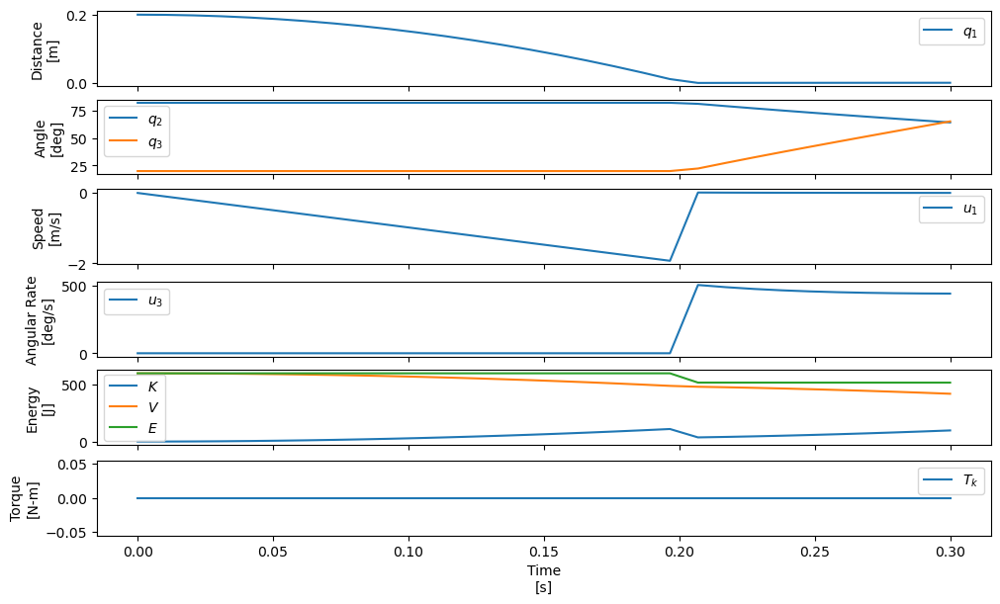

In [33]:
plot_results(ts_dae, xs_dae, Ks, Vs, Es, Tks);

In [34]:
p_vals = np.array([
  0.101,  # Ia,
  0.282,  # Ib,
  1e5,    # cf,
  30.0,   # ck,
  0.387,  # da,
  0.193,  # db,
  9.81,   # g,
  5e7,    # kf,
  10.0,   # kk,
  0.611,  # la,
  0.424,  # lb,
  6.769,  # ma,
  17.01,  # mb,
  3.0,    # mf,
  32.44,  # mu
])

In [35]:
x0, xd0 = setup_initial_conditions(0.0, np.deg2rad(5.0), 0.0, 0.0)

t0, tf, fps = 0.0, 3.0, 60
ts_dae, xs_dae, Ks, Vs, Es, Tks = simulate(t0, tf, fps, x0, xd0, p_vals, eval_r)

In [36]:
HTML(animate_linkage(ts_dae, xs_dae, p_vals).to_jshtml(fps=fps))

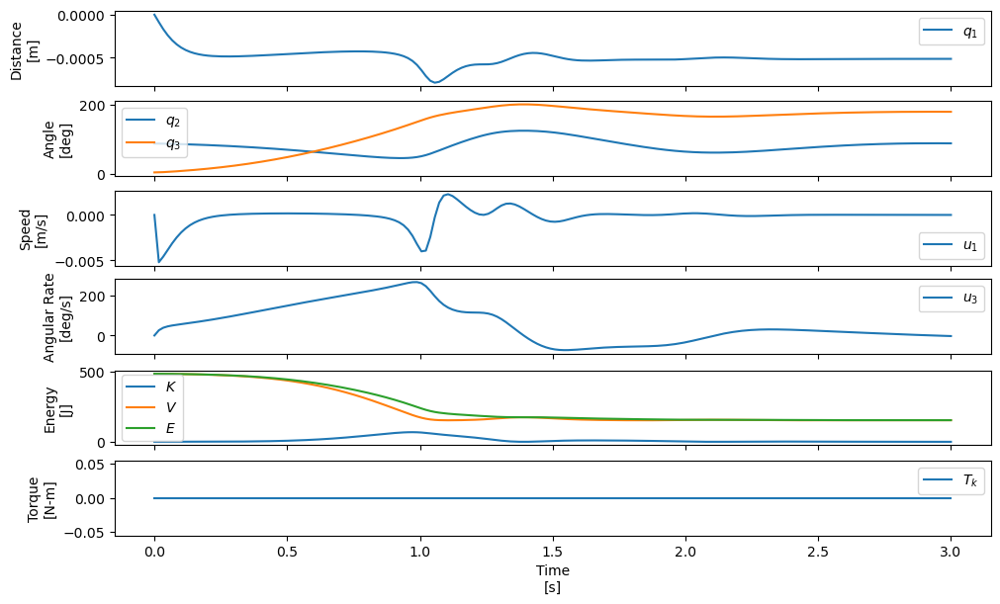

In [37]:
plot_results(ts_dae, xs_dae, Ks, Vs, Es, Tks);

In [38]:
def eval_r(t, x, p):

    if t < 0.9:
        Tk = [0.0]
    elif t > 1.1:
        Tk = [0.0]
    else:
        Tk = [900.0]

    return Tk

In [39]:
p_vals = np.array([
  0.101,  # Ia,
  0.282,  # Ib,
  1e5,    # cf,
  30.0,   # ck,
  0.387,  # da,
  0.193,  # db,
  9.81,   # g,
  5e7,    # kf,
  10.0,   # kk,
  0.611,  # la,
  0.424,  # lb,
  6.769,  # ma,
  17.01,  # mb,
  3.0,    # mf,
  32.44,  # mu
])

In [40]:
x0, xd0 = setup_initial_conditions(0.0, np.deg2rad(5.0), 0.0, 0.0)

t0, tf, fps = 0.0, 2.0, 60
ts_dae, xs_dae, Ks, Vs, Es, Tks = simulate(t0, tf, fps, x0, xd0, p_vals, eval_r)

<lambdifygenerated-5>:5: RuntimeWarning: invalid value encountered in power
  return ((1/2)*_Dummy_143**2*I_a*l_b**2*sin(_Dummy_140 + _Dummy_141)**2/(l_a*sin(_Dummy_141) + l_b*sin(_Dummy_140 + _Dummy_141))**2 + (1/2)*_Dummy_144**2*m_f + (1/2)*I_b*(-_Dummy_143*l_b*sin(_Dummy_140 + _Dummy_141)/(l_a*sin(_Dummy_141) + l_b*sin(_Dummy_140 + _Dummy_141)) + _Dummy_143)**2 + (1/2)*m_a*(_Dummy_143**2*d_a**2*l_b**2*sin(_Dummy_140 + _Dummy_141)**2/(l_a*sin(_Dummy_141) + l_b*sin(_Dummy_140 + _Dummy_141))**2 - 2*_Dummy_143*_Dummy_144*d_a*l_b*sin(_Dummy_140 + _Dummy_141)*cos(_Dummy_141)/(l_a*sin(_Dummy_141) + l_b*sin(_Dummy_140 + _Dummy_141)) + _Dummy_144**2) + (1/2)*m_b*(_Dummy_143**2*l_a**2*l_b**2*sin(_Dummy_140 + _Dummy_141)**2/(l_a*sin(_Dummy_141) + l_b*sin(_Dummy_140 + _Dummy_141))**2 - 2*_Dummy_143*_Dummy_144*l_a*l_b*sin(_Dummy_140 + _Dummy_141)*cos(_Dummy_141)/(l_a*sin(_Dummy_141) + l_b*sin(_Dummy_140 + _Dummy_141)) - 2*_Dummy_143*d_b*l_a*l_b*(-_Dummy_143*l_b*sin(_Dummy_140 + _Dummy_141)/(l_a*

In [41]:
HTML(animate_linkage(ts_dae, xs_dae, p_vals).to_jshtml(fps=fps))

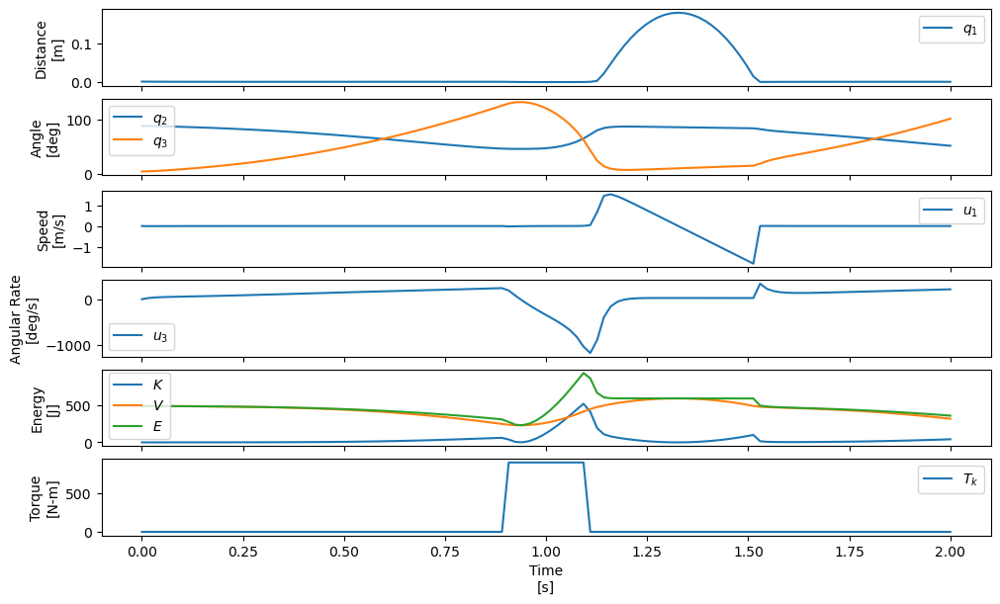

In [42]:
plot_results(ts_dae, xs_dae, Ks, Vs, Es, Tks);